In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Define the path to your dataset
# Load the data from the CSV file
data = np.loadtxt('./mnist_train.csv', delimiter=',', skiprows=1)

# Extract labels and pixel values
labels = data[:, 0].astype(int)  # The first column contains the labels
images = data[:, 1:]  # The rest of the columns are pixel values


In [3]:
x_train = images
y_train = labels

# Initialize an array to hold the sum of images for each digit
sum_images = np.zeros((10, 784))  # 10 digits, each image is 784 pixels
count_images = np.zeros(10)  # Count of images for each digit

# Loop through the dataset, summing up the images for each digit
for i in range(len(x_train)):
    sum_images[y_train[i]] += x_train[i]
    count_images[y_train[i]] += 1

# Calculate the average image for each digit
avg_images = sum_images / count_images[:, None]


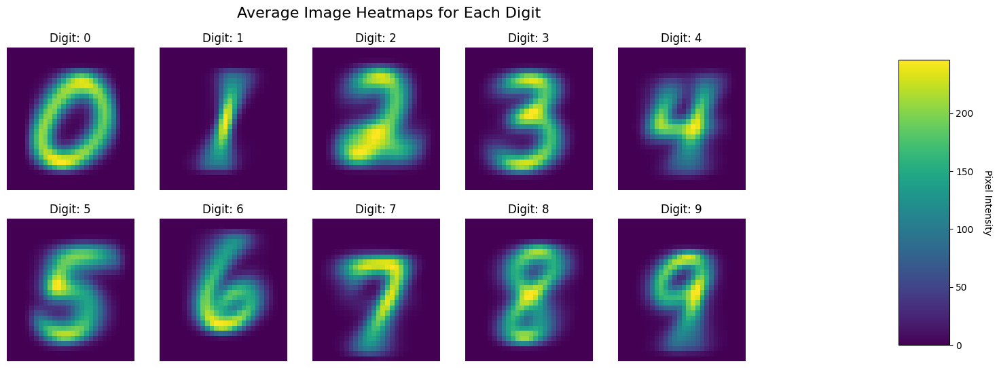

In [4]:
# Set up the matplotlib figure
fig, axes = plt.subplots(2, 5, figsize=(15, 6))  # 10 digits, so 2 rows, 5 cols
fig.suptitle('Average Image Heatmaps for Each Digit', fontsize=16)

# Loop through all digits 0-9
for digit in range(10):
    # Find the subplot row and column
    row, col = divmod(digit, 5)
    ax = axes[row, col]
    
    # Reshape 784-length vector to 28x28 to plot
    avg_img_matrix = avg_images[digit].reshape(28, 28)
    
    # Use seaborn to create the heatmap
    sns.heatmap(avg_img_matrix, ax=ax, cmap='viridis', cbar=False)
    ax.set_title(f'Digit: {digit}')
    ax.axis('off')  # Turn off axis for clarity

# Create an additional Axes where the colorbar will go
# It's invisible, doesn't take space, but we use its location to draw the colorbar
cbar_ax = fig.add_axes([1, 0.15, 0.05, 0.7])  # Adjust the [left, bottom, width, height] as needed

# Plot a dummy heatmap to use its color scale for the color bar
# Ensure it covers the range of values you have in your actual heatmaps
# Here, I'm assuming `avg_images` min/max span the range you want to show
norm = plt.Normalize(vmin=avg_images.min(), vmax=avg_images.max())
sm = plt.cm.ScalarMappable(cmap="viridis", norm=norm)
sm.set_array([])  # You can also set an actual array of values here

# Finally, create the colorbar using the ScalarMappable and the additional Axes
cbar = plt.colorbar(sm, cax=cbar_ax)
cbar.set_label('Pixel Intensity', rotation=270, labelpad=20)

# Adjust the main figure size and layout to accommodate the color bar
fig.subplots_adjust(right=0.85)  # Adjust this as necessary to fit your colorbar
plt.show()


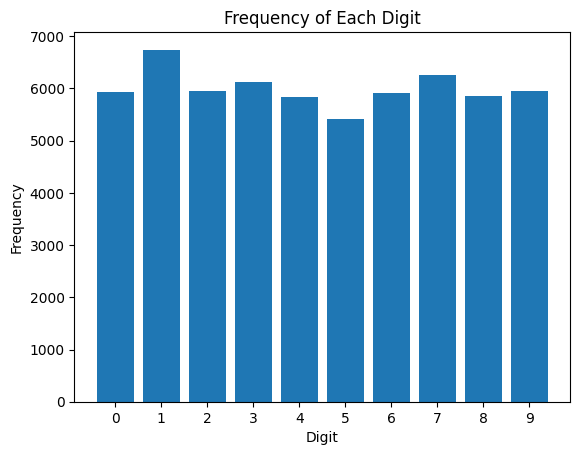

In [5]:
# Assuming `labels` contains your digit labels
unique, counts = np.unique(labels, return_counts=True)
plt.bar(unique, counts)
plt.title('Frequency of Each Digit')
plt.xlabel('Digit')
plt.ylabel('Frequency')
plt.xticks(unique)
plt.show()


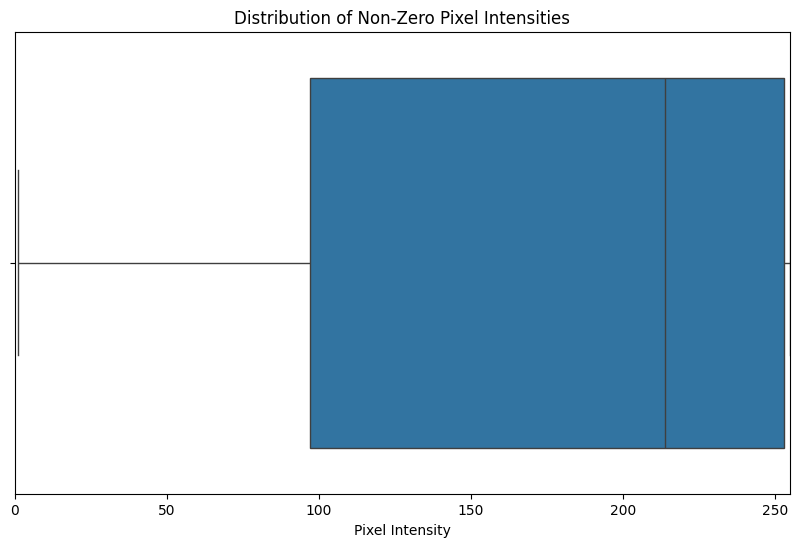

In [6]:
# Flatten the image array to a single long list of pixel values, excluding zeros
pixel_values = images.flatten()
pixel_values = pixel_values[pixel_values > 0]  # Exclude zeros

plt.figure(figsize=(10, 6))
sns.boxplot(x=pixel_values)
plt.title('Distribution of Non-Zero Pixel Intensities')
plt.xlabel('Pixel Intensity')
plt.xlim(0, 255)  # Ensure the x-axis covers the full range of pixel intensities
plt.show()


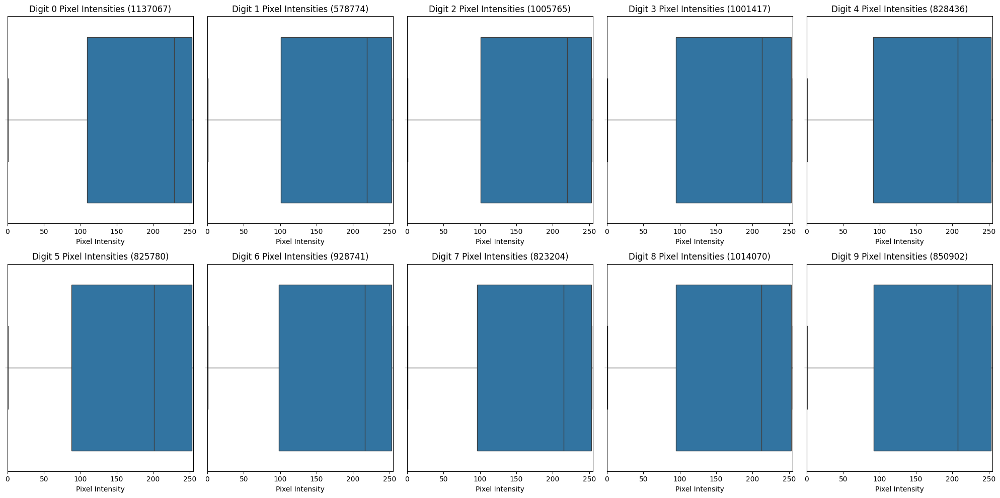

In [7]:
# Set the figure size
plt.figure(figsize=(20, 10))

# Create a subplot for each digit
for digit in range(10):
    # Filter images for the current digit
    digit_images = images[labels == digit]
    
    # Flatten the filtered images to a single long list of pixel values, excluding zeros
    pixel_values = digit_images.flatten()
    pixel_values = pixel_values[pixel_values > 0]  # Exclude zeros
    
    # Create a subplot for the current digit
    plt.subplot(2, 5, digit+1)
    sns.boxplot(x=pixel_values)
    plt.title(f'Digit {digit} Pixel Intensities ({pixel_values.size})')
    plt.xlabel('Pixel Intensity')
    plt.xlim(0, 255)  # Ensure the x-axis covers the full range of pixel intensities

plt.tight_layout()
plt.show()


In [8]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score


In [9]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.2, random_state=42)


In [10]:
# Initialize the Decision Tree Classifier
clf = DecisionTreeClassifier(random_state=42)

# Train the classifier on the training data
clf.fit(X_train, y_train)


DecisionTreeClassifier(random_state=42)

In [11]:
# Make predictions on the test set
predictions = clf.predict(X_test)

# Calculate and print the accuracy
accuracy = accuracy_score(y_test, predictions)
print(f"Accuracy: {accuracy:.4f}")


Accuracy: 0.8681


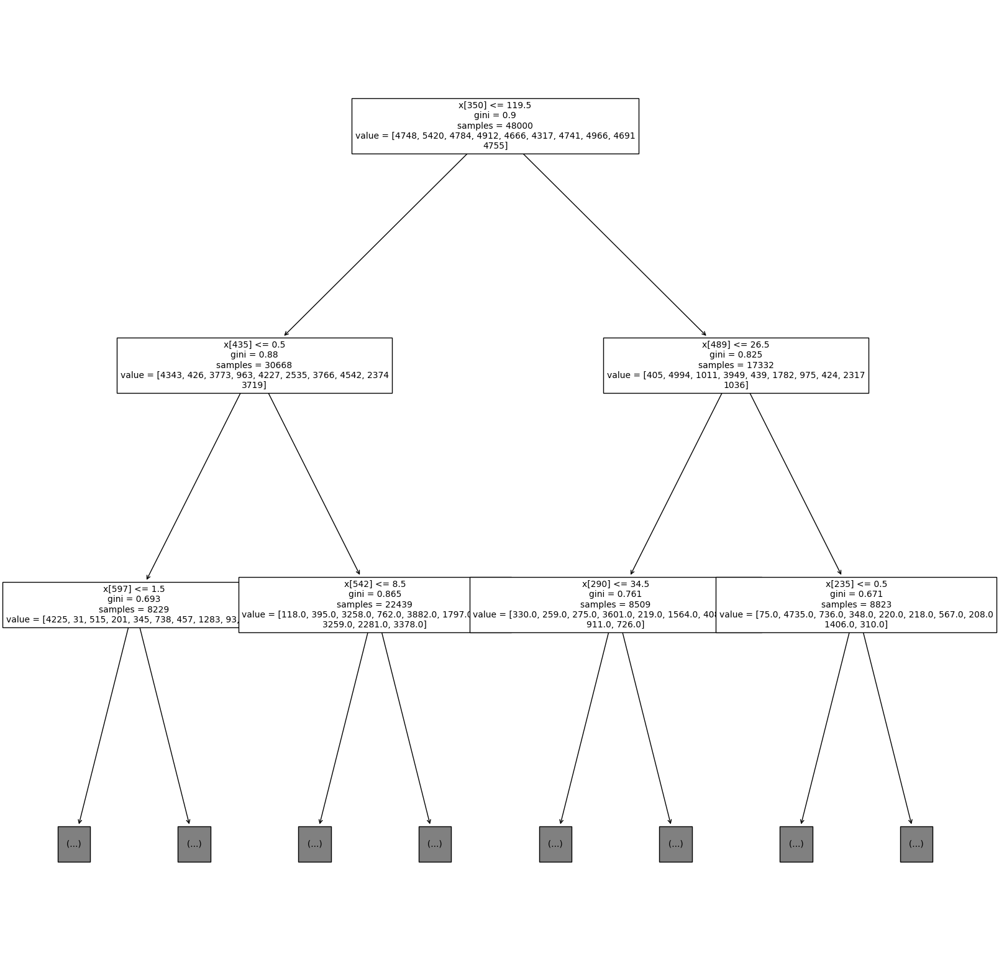

In [12]:
from sklearn import tree
import matplotlib.pyplot as plt

plt.figure(figsize=(20,20))
tree.plot_tree(clf, max_depth=2, fontsize=10)  # Adjust max_depth for detail level
plt.show()


In [13]:
import numpy as np

# Load the training data
train_data = np.loadtxt('mnist_train.csv', delimiter=',', skiprows=1)
X_train = train_data[:, 1:]  # Pixel values
y_train = train_data[:, 0].astype(int)  # Labels

# Load the test data
test_data = np.loadtxt('mnist_test.csv', delimiter=',', skiprows=1)
X_test = test_data[:, 1:]  # Pixel values
y_test = test_data[:, 0].astype(int)  # Labels


In [14]:
from sklearn.tree import DecisionTreeClassifier

# Initialize the Decision Tree Classifier
clf = DecisionTreeClassifier(random_state=42, max_depth=18)

# Train the classifier on the training data
clf.fit(X_train, y_train)


DecisionTreeClassifier(max_depth=18, random_state=42)

In [15]:
from sklearn.metrics import accuracy_score




In [16]:
from sklearn.metrics import confusion_matrix, accuracy_score
import numpy as np

# Assuming clf is your trained classifier and X_test, y_test are your test datasets

# Make predictions on the correct test set
predictions = clf.predict(X_test)

# Generate the confusion matrix
cm = confusion_matrix(y_test, predictions)

# Calculate accuracy for each digit
digit_accuracy = cm.diagonal() / cm.sum(axis=1)

# Calculate and print the overall accuracy
accuracy = accuracy_score(y_test, predictions)
print(f"Overall Accuracy: {accuracy:.4f}\n")

for digit in range(10):
    print(f"Accuracy for digit {digit}: {digit_accuracy[digit]:.4f}")


Overall Accuracy: 0.8829

Accuracy for digit 0: 0.9408
Accuracy for digit 1: 0.9683
Accuracy for digit 2: 0.8663
Accuracy for digit 3: 0.8624
Accuracy for digit 4: 0.8839
Accuracy for digit 5: 0.8374
Accuracy for digit 6: 0.8810
Accuracy for digit 7: 0.9086
Accuracy for digit 8: 0.7957
Accuracy for digit 9: 0.8672


In [17]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

from sklearn.tree import export_graphviz
import graphviz

# Export the decision tree to a DOT file
export_graphviz(clf, out_file="tree.dot", filled=True, rounded=True, special_characters=True, max_depth=12)

# Optionally, convert the DOT file to a PDF or PNG (requires Graphviz installed)
# !dot -Tpng tree.dot -o tree.png



In [18]:
depth = clf.get_depth()
print(f"The depth of the tree is: {depth}")


The depth of the tree is: 18


In [19]:
from sklearn.tree import plot_tree

plt.figure(figsize=(200, 80))
plot_tree(clf, max_depth=14, filled=True, rounded=True, fontsize=10)
plt.show()